<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>Комментария студента</b></font>
Привет, мой проект уже был на ревью до того как я ушел в академический отпуск, я доработал его и исправил замечания, так что это не первая итерация. Предполагая, что ревью после отпуска будет делать другой человек я удалил комментарии прошлого ревью.

</div>

# Проект “With Sense”

Ваш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Например, такое:

A man is crossing a mountain pass on a metal bridge.


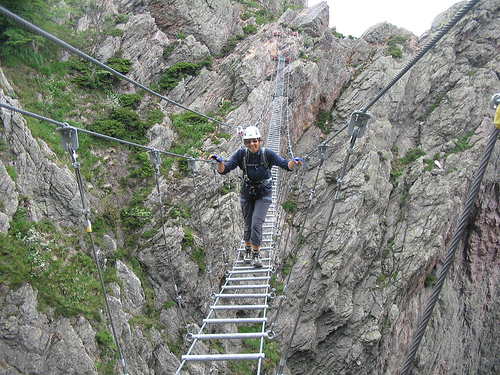

Сервис выводит несколько фотографий с такой же или похожей сценой.


Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать так называемый PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Вам поручено разработать демонстрационную версию поиска изображений по запросу.
Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу. 
На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.

# Импорты

In [1]:
import torch
import torch.nn as nn
import pandas as pd
from tqdm.notebook import tqdm
import statistics as st
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupShuffleSplit, train_test_split
import numpy as np
import math
import os

from catboost import *
from math import *

from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.preprocessing import StandardScaler


from keras.metrics import RootMeanSquaredError
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet import ResNet50
from keras.models import Sequential
from keras.layers import Dense, GlobalAveragePooling2D, BatchNormalization, Dropout
from keras.optimizers import Adam


from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

from PIL import Image
from pathlib import Path
import nltk

import matplotlib.pyplot as plt
import plotly.express as px

from transformers import AutoTokenizer, AutoModel
import missingno

In [2]:
RANDOM_STATE = 1220
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


PATH_DATA = './Data/to_upload'
PATH_TRAIN_IMAGE_FOLDER = PATH_DATA + '/train_images/'
PATH_TEST_IMAGE_FOLDER = PATH_DATA + '/test_images/'
PATH_TRAIN_DATASET = PATH_DATA + '/train_dataset.csv'
PATH_TEST_QUERIES = PATH_DATA + '/test_queries.csv'
PATH_TEST_IMAGES = PATH_DATA + '/test_images.csv'
PATH_CROWD_ANNOTATIONS = PATH_DATA + '/CrowdAnnotations.tsv'
PATH_EXPERT_ANNOTATIONS = PATH_DATA + '/ExpertAnnotations.tsv'
TEMP='./cache'

In [3]:
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('punkt')

Path(TEMP).mkdir(parents=True, exist_ok=True)

[nltk_data] Downloading package wordnet to C:\Users\Laba-
[nltk_data]     ml\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to C:\Users\Laba-
[nltk_data]     ml\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to C:\Users\Laba-
[nltk_data]     ml\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Загрузка и обзор данных 

In [4]:
try:
    train_df = pd.read_csv(PATH_TRAIN_DATASET)
    test_q = pd.read_csv(PATH_TEST_QUERIES, sep='|', index_col=0)

    CrowdAnnotations_df = pd.read_csv(PATH_CROWD_ANNOTATIONS,
                                    sep='\t', header=None, names=['image', 'query_id', 'pos_share', 'ex_1', 'ex_2'])
    ExpertAnnotations_df = pd.read_csv(PATH_EXPERT_ANNOTATIONS,
                                    sep='\t', header=None, names=['image', 'query_id', 'ex_1', 'ex_2', 'ex_3'])

    test_images_df = pd.read_csv(PATH_TEST_IMAGES, sep='|')
except FileNotFoundError:
    print('Произошла ошибка')

In [5]:
def info_df(df):
    print('------------------------------')
    print('| Информация о наборе данных |')
    print('------------------------------')
    df.info()
    print('-----------------------------------------')
    print('| Первые 5 строчек датасета |')
    print('-----------------------------------------')
    display(df.head())
    print('--------------------')
    print('| Сумма дубликатов |')
    print('--------------------')
    print(df.duplicated().sum())

In [6]:
for dataset in [train_df, CrowdAnnotations_df, ExpertAnnotations_df, test_q, test_images_df]:
    info_df(dataset)

------------------------------
| Информация о наборе данных |
------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
-----------------------------------------
| Первые 5 строчек датасета |
-----------------------------------------


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


--------------------
| Сумма дубликатов |
--------------------
0
------------------------------
| Информация о наборе данных |
------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   pos_share  47830 non-null  float64
 3   ex_1       47830 non-null  int64  
 4   ex_2       47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
-----------------------------------------
| Первые 5 строчек датасета |
-----------------------------------------


,image,query_id,pos_share,ex_1,ex_2
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


--------------------
| Сумма дубликатов |
--------------------
0
------------------------------
| Информация о наборе данных |
------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   ex_1      5822 non-null   int64 
 3   ex_2      5822 non-null   int64 
 4   ex_3      5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB
-----------------------------------------
| Первые 5 строчек датасета |
-----------------------------------------


,image,query_id,ex_1,ex_2,ex_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


--------------------
| Сумма дубликатов |
--------------------
0
------------------------------
| Информация о наборе данных |
------------------------------
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
-----------------------------------------
| Первые 5 строчек датасета |
-----------------------------------------


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


--------------------
| Сумма дубликатов |
--------------------
0
------------------------------
| Информация о наборе данных |
------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes
-----------------------------------------
| Первые 5 строчек датасета |
-----------------------------------------


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


--------------------
| Сумма дубликатов |
--------------------
0


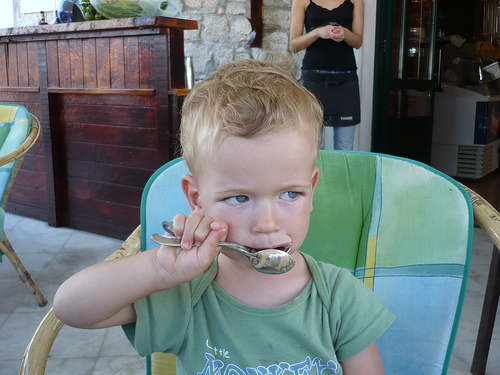

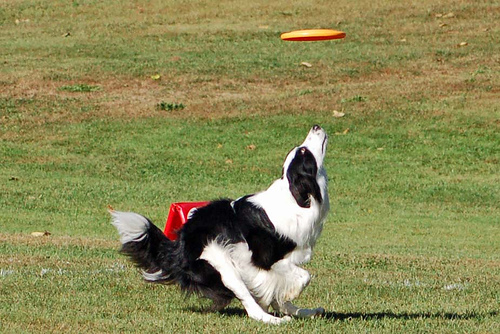

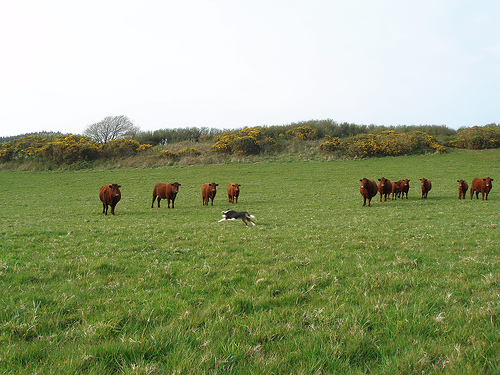

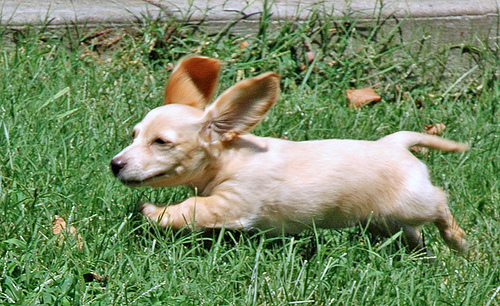

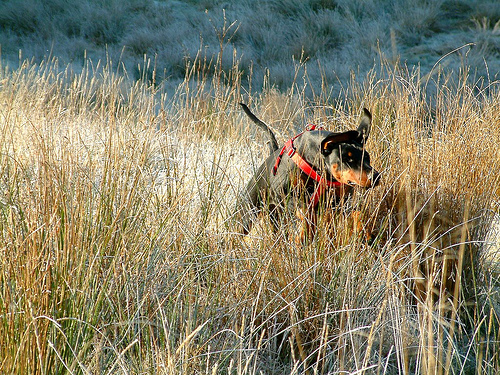

In [7]:
for i in range(280, 285):
    image_name = train_df.iloc[i]['image']
    img = Image.open(PATH_TRAIN_IMAGE_FOLDER+image_name).convert('RGB') 
    display(img)

**Вывод**

В нашем основном датасете около 5800 строк. Пропусков в данных нет. В признаке "query_id" содержится идентификатор описания в формате <имя файла изображения>#<порядковый номер описания>. 

В CrowdAnnotations содержится 47830 строк. Пропусков также нет. Столбец pos_share содержит информацию о доле людей, которые отметили пару картинка-описание как подходящие друг другу. Но в отличие от экспертов, люди ставили только 1 или 0. Тогда как эксперты могли выставлять оценку соответствия по шкале от 1 до 4. Можно сказать, что разметка данных от экспертов более качественная. 

Выборка содержит разные по формату и тематике изображения людей и животных.

**Описание данных**

**train_dataset**

* `image` - изображение в формате `jpg`
* `query_id` - идентификатор описания
* `query_text` - описание

**CrowdAnnotations**

* `image` - Имя файла изображения;
* `query_id` - Идентификатор описания;
* `pos_share` - Доля людей, подтвердивших, что описание соответствует изображению;
* `ex_1` - Количество человек, подтвердивших, что описание соответствует изображению;
* `ex_2` - Количество человек, подтвердивших, что описание не соответствует изображению.

**ExpertAnnotations**

Описание колонок:
* `image` - Имя файла изображения;
* `query_id` - Идентификатор описания;
* `ex_1` — оценка 1 эксперта;
* `ex_2` — оценка 2 эксперта;
* `ex_3` — оценка 3 эксперта.

# EDA

При обучении модели для решения задачи по поиску референсов, хотелось бы использовать данные как от экспертов, так и от крауд. Даже без объединения двух датасетов можно заметить, что будут пропуски в данных, хотя бы потому что данных крауда сильно больше.


Предлагается выполнить следующие действия по восстановлению полноты данных:

- найдем среднюю оценку экспертов
    - для тех случаев когда менение экспертов совсем разошлось возьмем среднюю оценку с округлением "вниз";
    - для всех остальных экспертных возьмем медианное значение.
- обучим регрессионную модель для восстановления оценок экспертов на основе оценок крауда и модель для восстановления оценок крауда на основе оценок экспертов;
- применим простое линейное преобразование (x-1) /3, для перевода средних оценок экспертов из диапазона 1-4 в диапазон 0-1;
- найдем средневзвешенную оценку от двух источников по соотношению 8 - эксперты : 2 - крауд;
- восстановим описание для одинаковых изображений из разных таблиц, а те изображения к которым нет описания удалим.





In [8]:
'''Функция для вычисления средней оценки экспертов'''
def calc_mode_exp(row):
    if row['ex_1'] != row['ex_2'] != row['ex_3']:
        return math.floor((row['ex_1'] + row['ex_2'] + row['ex_3']) / 3)
    else:
        return int(np.median(row['ex_1':'ex_3']))

In [9]:
ExpertAnnotations_df['agr_ex'] = ExpertAnnotations_df.apply(lambda x: calc_mode_exp(x), axis=1)

In [10]:
ExpertAnnotations_df.head(5)

,image,query_id,ex_1,ex_2,ex_3,agr_ex
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1


Объединим оценки крауда и экспертов

In [11]:
merge_est = pd.merge(
    ExpertAnnotations_df,
    CrowdAnnotations_df,
    on=['image', 'query_id'],
    how='outer',
    suffixes=('_crowd', '_expert')
)

In [12]:
merge_est.head()

,image,query_id,ex_1_crowd,ex_2_crowd,ex_3,agr_ex,pos_share,ex_1_expert,ex_2_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0,1.0,1.0,1.0,0.0,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0,1.0,2.0,1.0,0.0,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0,1.0,2.0,1.0,NaN,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.0,2.0,2.0,2.0,NaN,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0,1.0,2.0,1.0,NaN,NaN,NaN


--------------------------------
|      Пропуски в данных       |
--------------------------------


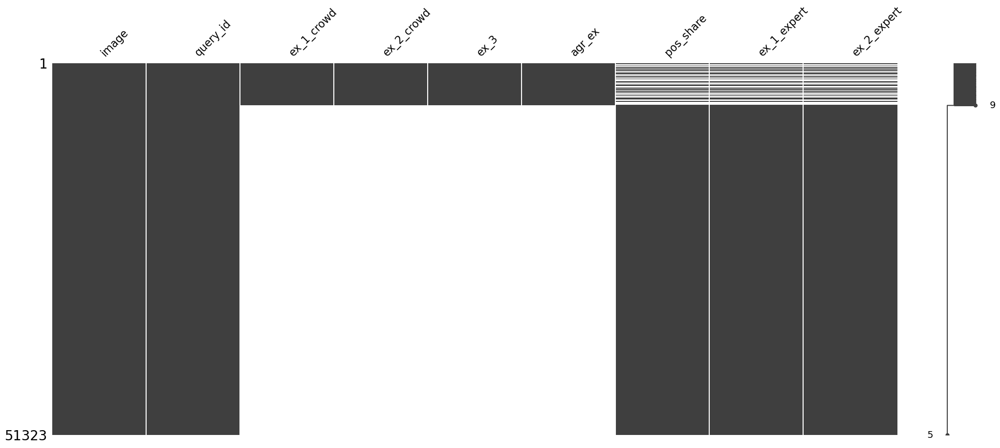

In [13]:
print('--------------------------------')
print('|      Пропуски в данных       |')
print('--------------------------------')
missingno.matrix(merge_est);

Объединение оценок

В исходных данных имеется большое количество оценок от краудсорсинга, но на большинство их оценок, нет оценок экспертов, чтобы не терять данные попробуем решить задачу регрессии и обучим модель для решение задачи регрессии по восстановлению потенциальной оценки экспертов, на основе данных где есть оценка краудсорсинга и экспертов и для восстановления оценок крауда на основе оценок экспертов.

В качестве моделей возьмем `LogisticRegression`, `LinearRegression` и `CatBoostRegression`.

Создадим копию объединенного датасета без пропусков для обучения моделей.

In [14]:
merge_est_wnan = merge_est.dropna()

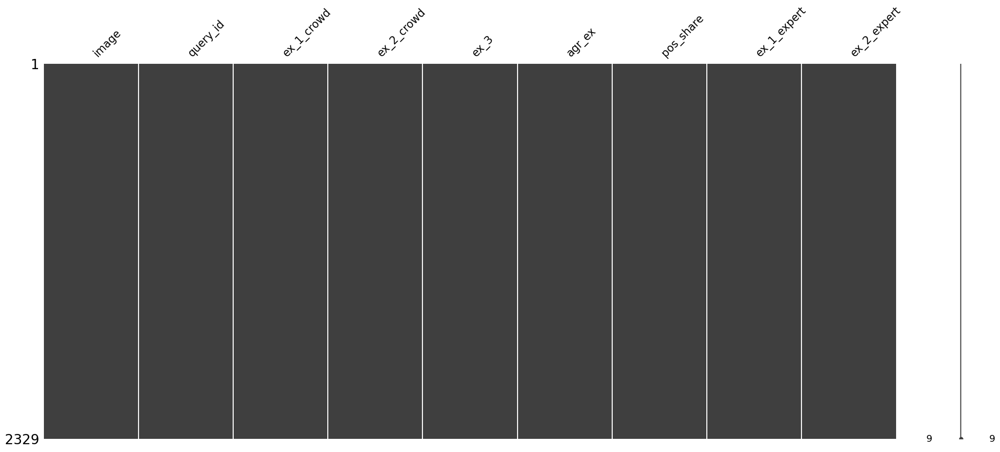

In [15]:
missingno.matrix(merge_est_wnan);

In [16]:
for i in ExpertAnnotations_df['agr_ex'].unique():
    subset = merge_est_wnan[merge_est_wnan['agr_ex'] == i]
    mean_fraction = subset['pos_share'].mean()
    std_fraction = subset['pos_share'].std()
    print(f'Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной {i}:',
          '{:.0%}'.format(mean_fraction),
          ', std:',
          '{:.0%}'.format(std_fraction))

Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 1: 0% , std: 3%
Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 2: 5% , std: 14%
Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 3: 31% , std: 32%
Средняя доля людей, подтвердивших, что описание соответствует изображению (%) при оценке экспертов равной 4: 89% , std: 20%


На основе расспределения оценок выполним вычисление агрегированной оценки крауда в формате 1-4.

In [17]:
def agr_merge(row):
    if row['pos_share'] >= 0.70:
        return 4.0
    elif row['pos_share'] >= 0.30:
        return 3.0
    elif row['pos_share'] >= 0.10:
        return 2.0
    return 1.0

In [18]:
features_func = merge_est[['agr_ex', 'pos_share']].copy()
features_func.dropna(inplace=True)
features_func['predict'] = features_func.apply(agr_merge, axis=1)

In [19]:
agr_expert_models = pd.DataFrame(columns=['RMSE'])

def update_model_results(df, model_name, accuracy):
    df.loc[model_name, 'RMSE'] = accuracy
    return df

**Обучение моедели для восстановления данных об оценки экспертов на основе оценок крауд**

In [20]:
target = merge_est_wnan['agr_ex']
features = merge_est_wnan[['pos_share', 'ex_1_crowd', 'ex_2_crowd']]

features_train, features_test, target_train, target_test = train_test_split(features,
                                                                            target,
                                                                            test_size=0.25,
                                                                            random_state=RANDOM_STATE)

In [21]:
cat_features = features_train.select_dtypes(include='object').columns.to_list()

In [22]:
model_lr = LogisticRegression(class_weight="balanced", 
                              random_state=RANDOM_STATE).fit(features_train, target_train)

predictions = model_lr.predict(features_test)

update_model_results(agr_expert_models,
            'LogisticRegression',
            round(accuracy_score(target_test, predictions), 4))

agr_expert_models

,RMSE
LogisticRegression,1.0


In [23]:
cat_model_cr = CatBoostRegressor(loss_function='RMSE',
                                      depth=10,
                                      eval_metric='AUC',
                                      learning_rate=0.01,
                                      random_state=RANDOM_STATE,
                                      task_type="GPU",
                                      cat_features=cat_features,
                                      ).fit(features_train, target_train,
                                            plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Default metric period is 5 because AUC is/are not implemented for GPU
AUC is not implemented on GPU. Will use CPU for metric computation, this could significantly affect learning time


In [24]:
predicted = cat_model_cr.predict(features_test)

In [25]:
update_model_results(agr_expert_models,
            'CatBoost',
            round(accuracy_score(target_test, round(pd.Series(predicted))), 4))

,RMSE
LogisticRegression,1.0
CatBoost,1.0


**Обучение моедели для восстановления данных об крауда на основе оценок экспертов**

In [26]:
fraction_models = pd.DataFrame(columns=['RMSE'])

def alter_table(df, model_name, rmse):
    fraction_models.loc[model_name, 'RMSE'] = rmse

    return df

In [27]:
data_merged_expert = merge_est.copy()
data_merged_expert.dropna(inplace=True)

features = data_merged_expert[['ex_1_expert', 'ex_2_expert', 'ex_3', 'agr_ex']]
target = data_merged_expert['pos_share']


In [28]:
features_train, features_test, target_train, target_test = train_test_split(features,
                                                                            target,
                                                                            test_size=0.25,
                                                                            random_state=RANDOM_STATE)

In [29]:
cat_features = features_train.select_dtypes(include='object').columns.to_list()

In [30]:
model_lr = LinearRegression().fit(features_train, target_train)

predictions = model_lr.predict(features_test)

alter_table(fraction_models,
            'LinearRegression',
            round(np.sqrt(mean_squared_error(target_test, predictions)), 4))

fraction_models

,RMSE
LinearRegression,0.0161


In [31]:
cat_model_ex = CatBoostRegressor(loss_function='RMSE',
                                      depth=10,
                                      learning_rate=0.01,
                                      random_state=RANDOM_STATE,
                                      task_type="GPU",
                                      cat_features=cat_features,
                                      ).fit(features_train, target_train,
                                            plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [32]:
predicted = cat_model_ex.predict(features_test)

In [33]:
alter_table(fraction_models,
            'CatBoostRegressor',
            round(np.sqrt(mean_squared_error(target_test, predicted)), 4))

,RMSE
LinearRegression,0.0161
CatBoostRegressor,0.0028


Заполним пропуски прогнозными данными

In [34]:
def fill_nan(row):
    if np.isnan(row['agr_ex']):
        a = cat_model_cr.predict([[row['pos_share'], row['ex_1_crowd'], row['ex_2_crowd']]])[0]
        row['agr_ex'] = a
    elif np.isnan(row['pos_share']):
        b = np.round((cat_model_ex.predict([[row['ex_1_expert'], row['ex_2_expert'], row['ex_3'], row['agr_ex']]]))[0], 6)
        row['pos_share'] = b

    return row

merge_est = merge_est.apply(fill_nan, axis=1)
merge_est.head()

,image,query_id,ex_1_crowd,ex_2_crowd,ex_3,agr_ex,pos_share,ex_1_expert,ex_2_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0,1.0,1.0,1.0,0.000000,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0,1.0,2.0,1.0,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0,1.0,2.0,1.0,0.212760,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.0,2.0,2.0,2.0,0.216907,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0,1.0,2.0,1.0,0.212760,NaN,NaN


Применим линейное преобразование к столбцу 'agr_ex' с оценками в диапазоне [1, 4] -> [0, 1]

In [35]:
merge_est['agr_ex'] = (merge_est['agr_ex'] - 1) / 3.0

merge_est['agr_ex'] = round(merge_est['agr_ex'], 2)

merge_est.head()

,image,query_id,ex_1_crowd,ex_2_crowd,ex_3,agr_ex,pos_share,ex_1_expert,ex_2_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1.0,1.0,1.0,0.00,0.000000,0.0,3.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1.0,1.0,2.0,0.00,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1.0,1.0,2.0,0.00,0.212760,NaN,NaN
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1.0,2.0,2.0,0.33,0.216907,NaN,NaN
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1.0,1.0,2.0,0.00,0.212760,NaN,NaN


In [36]:
merge_est.dropna(axis=1, inplace=True)

merge_est.head()

,image,query_id,agr_ex,pos_share
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.00,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.00,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.00,0.212760
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.33,0.216907
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.00,0.212760


Производим агрегацию оценок, учитывая как мнение экспертов, так и оценку краудсорсинга. Вес мнения экспертов составляет 80%, а вес оценки краудсорсинга - 20%.

In [37]:
def scoring(row):
    row['score'] = row['agr_ex'] * .8 + row['pos_share'] * .2
    return row

merge_est = merge_est.apply(scoring, axis=1)

display(merge_est.head())

display(merge_est.describe())

,image,query_id,agr_ex,pos_share,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0.00,0.000000,0.000000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0.00,0.000000,0.000000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.00,0.212760,0.042552
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0.33,0.216907,0.307381
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0.00,0.212760,0.042552


,agr_ex,pos_share,score
count,51323.000000,51323.000000,51323.000000
mean,0.035824,0.078335,0.044326
std,0.120920,0.203442,0.124322
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000


Объединим train_data с получившимся массивом merge_est по столбцам 'image' и 'query_id'

In [38]:
train_data = pd.merge(train_df, merge_est[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [39]:
# Для дальнейшей обработки и заполнения NaN значений создадим отдельный DataFrame в котором будут только строки где столбец 'query_text' без NaN 
notna_train = train_data[train_data['query_text'].notna()]

In [40]:
# Для проверки ситуации, когда у одного id есть несколько значений, выберем индекс idx
idx = 1220

print(train_data.iloc[idx])

# Затем, для определенного query_id (qid) из этой строки, выведем соответствующие ему значения 'query_text'из DataFrame notna_train, где 'query_text' без NaN значения
qid = train_data.iloc[idx]['query_id']
notna_train.loc[notna_train['query_id'] == qid]['query_text']

image                                 3745451546_fc8ec70cbd.jpg
query_id                            3123351642_3794f2f601.jpg#2
query_text    A snowboarder jumps high in the air over a sno...
score                                                     0.264
Name: 1220, dtype: object


1213    A snowboarder jumps high in the air over a sno...
1214    A snowboarder jumps high in the air over a sno...
1215    A snowboarder jumps high in the air over a sno...
1216    A snowboarder jumps high in the air over a sno...
1217    A snowboarder jumps high in the air over a sno...
1218    A snowboarder jumps high in the air over a sno...
1219    A snowboarder jumps high in the air over a sno...
1220    A snowboarder jumps high in the air over a sno...
1221    A snowboarder jumps high in the air over a sno...
Name: query_text, dtype: object

In [41]:
# Заполним все пропущенные значения в столбце 'query_text' на основе 'query_id'
def fillna_train(row):
    
    if pd.isnull(row['query_text']):
        text = notna_train[notna_train['query_id'] == row['query_id']]['query_text']
        if len(text) != 0:
            row['query_text'] = text.iloc[0]
    return row

# Применяем функцию для заполнения пропущенных значений
train_data = train_data.apply(fillna_train, axis=1)

In [42]:
# Удалим строки с NaN значениями, для которых не было найдено соответствующего 'query_id'
train_data.dropna(inplace=True)

display(train_data.head(10))
train_data.info()

,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.040973
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.264000
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.040973
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.264000
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.040973
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.040973
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.040973
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


Напишем функцию для просмотра изображений

In [43]:
def image_show(images, titles=None, nums=None):
    fig = plt.figure(figsize=(10, len(images) * 3))

    for i in range(len(images)):
        fig.add_subplot(len(images), 1, i + 1)
        img = Image.open(images[i])
        if titles != None:
            if nums != None:
                if nums[i] == None:
                    plt.title(f'\n{titles[i]}', fontsize = 10)
                else:
                    plt.title(f'\n{str(nums[i])}\n{titles[i]}', fontsize = 10)
            else:
                plt.title(f'\n{titles[i]}', fontsize = 10)
        plt.axis('off')
        plt.imshow(img)

    plt.show()

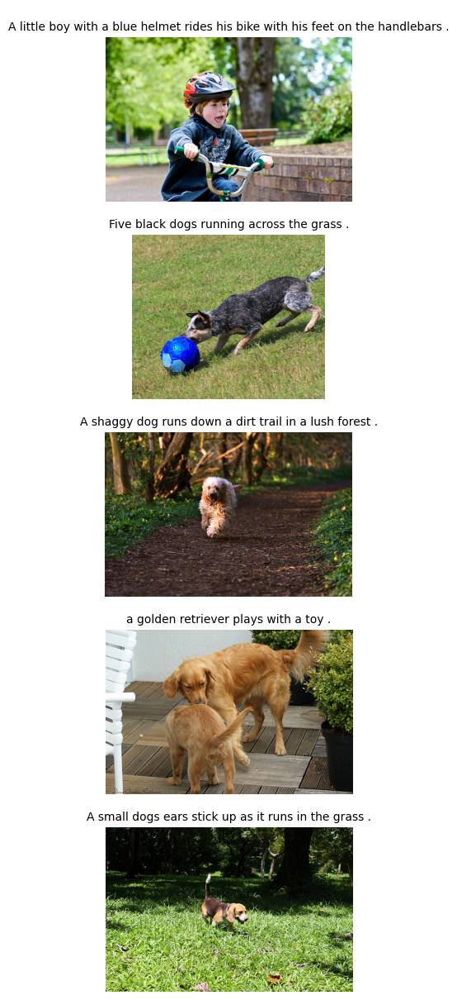

In [44]:
visual_dataset = train_data[train_data['score'] > 0.5].sample(5).copy()

visual_dataset.reset_index(inplace=True)

images = []
labels = []

for i in range(visual_dataset.shape[0]):
    images.append(f'{PATH_TRAIN_IMAGE_FOLDER}/{visual_dataset.iloc[i]["image"]}')
    labels.append(visual_dataset.iloc[i]['query_text'])

image_show(images, labels)

**Вывод**

Данные объеденены и готовы к предобработке. Поставленные выше задачи по подготовке, восстановлению и масштабированию оценок экспертов и крауда были выполнены. Подготовлена фукнция для просмотра изображений

# Подготовка данных

## Юридическое ограничение

В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.
В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

⎢ This image is unavailable in your country in compliance with local laws.

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер. 

In [45]:
stop_words = [
    'baby',
    'child',
    'little boy',
    'little girl',
    'kid',
    'kids',
    'young girl',
    'young boy',
    'boy',
    'girl',
    'children'
]

In [46]:
def stop_word_c(txt):
    txt = txt.lower()
    lemmatizer = WordNetLemmatizer()
    word_tokens = word_tokenize(txt)
    lemmatized_output = ' '.join([lemmatizer.lemmatize(w) for w in word_tokens])

    for word in stop_words:
        word_len = len(word.split())

        if word_len > 1:
            if word in txt:
                return True
        elif word_len == 1:
            if word in txt.split():
                return True

    return False

In [47]:
train_data['stopw'] = train_data['query_text'].apply(stop_word_c)

train_data[train_data['stopw'] == True].info()

<class 'pandas.core.frame.DataFrame'>
Index: 12247 entries, 0 to 51308
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       12247 non-null  object 
 1   query_id    12247 non-null  object 
 2   query_text  12247 non-null  object 
 3   score       12247 non-null  float64
 4   stopw       12247 non-null  bool   
dtypes: bool(1), float64(1), object(3)
memory usage: 490.4+ KB


Определим список фотографий где изображены дети, чтобы не допустить эту информацию в датасет для обучения

In [48]:
bad_index = train_data[train_data['stopw'] == True].reset_index()

In [49]:
bad_index

,index,image,query_id,query_text,score,stopw
0,0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,True
1,1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.040973,True
2,2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.264000,True
3,3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000,True
4,4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.040973,True
...,...,...,...,...,...,...
12242,51275,979383193_0a542a059d.jpg,820169182_f5e78d7d19.jpg#2,Two children look up .,0.000000,True
12243,51281,997722733_0cb5439472.jpg,2061144717_5b3a1864f0.jpg#2,A man in an ampitheater talking to a boy .,0.000000,True
12244,51291,997722733_0cb5439472.jpg,2553550034_5901aa9d6c.jpg#2,A boy climbs up some rocks .,0.269333,True
12245,51304,997722733_0cb5439472.jpg,3315616181_15dd137e27.jpg#2,A teenage boy climbs an indoor climbing wall .,0.000000,True


In [50]:
bad_index = [i[:-2] for i in bad_index['query_id']]

In [51]:
bad_indexs = []
for i in bad_index:
    if i not in bad_indexs:
        bad_indexs.append(i)

In [52]:
bad_indexs

['2549968784_39bfbe44f9.jpg',
 '2718495608_d8533e3ac5.jpg',
 '3545652636_0746537307.jpg',
 '1714316707_8bbaa2a2ba.jpg',
 '2140182410_8e2a06fbda.jpg',
 '2479652566_8f9fac8af5.jpg',
 '1287475186_2dee85f1a5.jpg',
 '2358554995_54ed3baa83.jpg',
 '2544426580_317b1f1f73.jpg',
 '191003285_edd8d0cf58.jpg',
 '2370481277_a3085614c9.jpg',
 '2577972703_a22c5f2a87.jpg',
 '3388330419_85d72f7cda.jpg',
 '2274992140_bb9e868bb8.jpg',
 '2445283938_ff477c7952.jpg',
 '2510020918_b2ca0fb2aa.jpg',
 '3325497914_f9014d615b.jpg',
 '3549583146_3e8bb2f7e9.jpg',
 '1131932671_c8d17751b3.jpg',
 '3245460937_2710a82709.jpg',
 '3516825206_5750824874.jpg',
 '3239021459_a6b71bb400.jpg',
 '3459156091_c1879ebe28.jpg',
 '1237985362_dbafc59280.jpg',
 '2594042571_2e4666507e.jpg',
 '533713007_bf9f3e25b4.jpg',
 '2295750198_6d152d7ceb.jpg',
 '3185409663_95f6b958d8.jpg',
 '2228022180_9597b2a458.jpg',
 '3243588540_b418ac7eda.jpg',
 '3280052365_c4644bf0a5.jpg',
 '3470951932_27ed74eb0b.jpg',
 '2501595799_6316001e89.jpg',
 '2660008870

In [53]:
train_data = train_data.loc[train_data['stopw'] == False]
train_data = train_data.dropna()

In [54]:
train_data.head()

,image,query_id,query_text,score,stopw
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.042552,False
23,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.307381,False
24,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.264000,False
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.307381,False
26,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.042552,False


## Векторизация изображений

Создадим генератор данных для обучения модели. Загрузим свёрточную нейросеть ResNet50, она позволит извлечь главные компоненты изображений. Добавим слой GlobalAveragePooling2D для усреднения признаков по пространству. Скомпилируем модель, используя среднеквадратичную ошибку как функцию потерь и оптимизатор Adam с низкой скоростью обучения.

In [55]:
train_datagen = ImageDataGenerator(rescale=1./255)

train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_data,
        directory=Path(PATH_TRAIN_IMAGE_FOLDER),
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=RANDOM_STATE)

features, target = train_gen_flow.next()

Found 37967 validated image filenames.


C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\2263390411.py:7: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


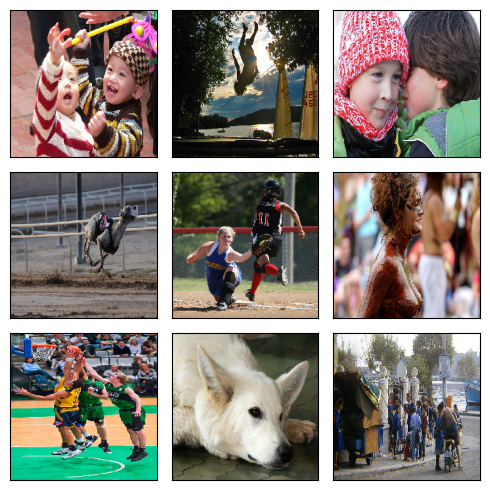

In [56]:
fig = plt.figure(figsize=(5,5))
for i in range(9):
    fig.add_subplot(3, 3, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [57]:
def create_model():
    backbone = ResNet50(input_shape=(224, 224, 3),
                        include_top=False,
                        weights='imagenet')

    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=0.0001), metrics=['mae'])

    return model

In [58]:
def image2vector(model, train_data):
    predictions = model.predict(train_data)
    return predictions

In [59]:
image_model = create_model()

image_embeddings = image2vector(image_model, train_gen_flow)

image_embeddings.shape

2373/2373 [==============================] - 92s 39ms/step


(37967, 2048)

In [60]:
print(f'''Векторизация изображения на основе модели resnet50 позволило получить вектор длинной {image_embeddings[0].shape[0]}
Уменьшение вектора позволит сэкономить ресурсы и вычислительное время при обучении.''')

Векторизация изображения на основе модели resnet50 позволило получить вектор длинной 2048
Уменьшение вектора позволит сэкономить ресурсы и вычислительное время при обучении.


## Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.

In [61]:
tokenizer = AutoTokenizer.from_pretrained('distilbert-base-uncased')
model = AutoModel.from_pretrained('distilbert-base-uncased')

model.to(DEVICE)

DistilBertModel(
  (embeddings): Embeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (transformer): Transformer(
    (layer): ModuleList(
      (0-5): 6 x TransformerBlock(
        (attention): MultiHeadSelfAttention(
          (dropout): Dropout(p=0.1, inplace=False)
          (q_lin): Linear(in_features=768, out_features=768, bias=True)
          (k_lin): Linear(in_features=768, out_features=768, bias=True)
          (v_lin): Linear(in_features=768, out_features=768, bias=True)
          (out_lin): Linear(in_features=768, out_features=768, bias=True)
        )
        (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (ffn): FFN(
          (dropout): Dropout(p=0.1, inplace=False)
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Li

In [62]:
def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0]
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    sum_embeddings = torch.sum(token_embeddings * input_mask_expanded, 1)
    sum_mask = torch.clamp(input_mask_expanded.sum(1), min=1e-9)
    return sum_embeddings / sum_mask

In [63]:
def text2vector(sentences):
    encoded_input = tokenizer(sentences, padding=True, truncation=True, max_length=128, return_tensors='pt').to(DEVICE)

    with torch.no_grad():
        model_output = model(**encoded_input)

    sentence_embeddings = mean_pooling(model_output, encoded_input['attention_mask'])

    pbar.update(1)
    ar = sentence_embeddings[0].to('cpu').detach().numpy()
    return ar

In [64]:
with tqdm(total=train_data.shape[0]) as pbar:
        train_data['text2vec'] = train_data['query_text'].apply(lambda x: text2vector(x))

  0%|          | 0/37967 [00:00<?, ?it/s]

## Объединение векторов

Объединим векторные представления изображений и текста в один признаковый массив

In [65]:
features = np.concatenate((image_embeddings, pd.DataFrame(list(train_data['text2vec']))), axis=1)

target = np.array(train_data['score'])

print("Размерность массива признаков:", features.shape)
print("Размерность целевой переменной:", target.shape)

Размерность массива признаков: (37967, 2816)
Размерность целевой переменной: (37967,)


## Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 8:2 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

### Разделение на train и test

In [66]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=RANDOM_STATE)
train_indices, test_indices = next(gss.split(X=train_data.drop(columns=['score']), 
                                             y=train_data['score'], 
                                             groups=train_data['image']))

target = np.array(train_data['score'])

features_train, features_test = features[train_indices], features[test_indices]
target_train, target_test = target[train_indices], target[test_indices]

In [67]:
# Выведем статистику по признакам в обучающей и тестовой выборках
print('Статистика по обучающей выборке:')
print('Максимальное значение в features_train:', features_train.max())
print('Минимальное значение в features_train:', features_train.min())
print('Среднее значение в features_train:', features_train.mean())
print('Стандартное отклонение в features_train:', features_train.std())

print('\nСтатистика по тестовой выборке:')
print('Максимальное значение в features_test:', features_test.max())
print('Минимальное значение в features_test:', features_test.min())
print('Среднее значение в features_test:', features_test.mean())
print('Стандартное отклонение в features_test:', features_test.std())

Статистика по обучающей выборке:
Максимальное значение в features_train: 15.33986
Минимальное значение в features_train: -4.3429
Среднее значение в features_train: 0.0802803
Стандартное отклонение в features_train: 0.5813932

Статистика по тестовой выборке:
Максимальное значение в features_test: 15.33986
Минимальное значение в features_test: -4.3429
Среднее значение в features_test: 0.080164626
Стандартное отклонение в features_test: 0.5811249


In [68]:
# Инициализируем и обучаем StandardScaler на обучающих данных
scaler = StandardScaler()
scaler.fit(features_train)

# Преобразуем обучающие и тестовые данные с помощью StandardScaler
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

## LinearRegression

Обучим модель линейной регрессии и воспользуемся метрикой среднеквадратической ошибки RMSE. Чем ближе значение к нулю, тем лучше качество. Преимущество выбора данной метрики в том, что она измеряется в той же единице, что и целевая переменная.

In [69]:
# Обучим модель линейной регрессии
model_lr = LinearRegression().fit(features_train, target_train)

predictions = model_lr.predict(features_test)

rmse_lr = np.sqrt(mean_squared_error(target_test, predictions))
print(f'RMSE для модели линейной регрессии: {rmse_lr:.4f}')

RMSE для модели линейной регрессии: 0.1256


## NerualNetwork

Напишем полносвязную нейронную сеть используя оптимизатор Adam и комбинацию функций активации ReLU, Tanh и linear

In [70]:
model_nn = Sequential()

model_nn.add(Dense(1024, activation='relu', input_shape=(2816,)))
model_nn.add(BatchNormalization())
model_nn.add(Dense(512, activation='tanh'))
model_nn.add(Dropout(0.2))
model_nn.add(Dense(256, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(128, activation='relu'))
model_nn.add(BatchNormalization())
model_nn.add(Dense(64, activation='relu'))
model_nn.add(Dense(1, activation='linear'))

model_nn.compile(loss='mean_squared_error',
                optimizer=Adam(learning_rate=0.0001),
                metrics=[RootMeanSquaredError()])

In [71]:
# Обучим нейросеть
model_nn.fit(
    features_train,  
    target_train,    
    epochs=25,
    batch_size=32,   
    validation_data=(features_test, target_test),  
    validation_steps=math.ceil(features_train.shape[1] / 32), 
    verbose=2        
)

Epoch 1/25
947/947 - 4s - loss: 0.2027 - root_mean_squared_error: 0.4502 - val_loss: 0.0708 - val_root_mean_squared_error: 0.2662 - 4s/epoch - 4ms/step
Epoch 2/25
947/947 - 3s - loss: 0.0517 - root_mean_squared_error: 0.2274 - val_loss: 0.0445 - val_root_mean_squared_error: 0.2108 - 3s/epoch - 3ms/step
Epoch 3/25
947/947 - 3s - loss: 0.0311 - root_mean_squared_error: 0.1764 - val_loss: 0.0371 - val_root_mean_squared_error: 0.1927 - 3s/epoch - 3ms/step
Epoch 4/25
947/947 - 3s - loss: 0.0244 - root_mean_squared_error: 0.1561 - val_loss: 0.0360 - val_root_mean_squared_error: 0.1897 - 3s/epoch - 3ms/step
Epoch 5/25
947/947 - 3s - loss: 0.0212 - root_mean_squared_error: 0.1455 - val_loss: 0.0343 - val_root_mean_squared_error: 0.1853 - 3s/epoch - 3ms/step
Epoch 6/25
947/947 - 3s - loss: 0.0197 - root_mean_squared_error: 0.1403 - val_loss: 0.0332 - val_root_mean_squared_error: 0.1821 - 3s/epoch - 3ms/step
Epoch 7/25
947/947 - 3s - loss: 0.0187 - root_mean_squared_error: 0.1367 - val_loss: 0.0

# Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [72]:
image_filenames = [filename for filename in os.listdir(PATH_TEST_IMAGE_FOLDER) if filename.endswith('.jpg')]
test_image = pd.DataFrame(image_filenames, columns=['image'])
test_image.name = 'test_image'

In [73]:
# Создадим генератор для тестовых данных
test_datagen = ImageDataGenerator(rescale=1./255) 
test_gen_flow = train_datagen.flow_from_dataframe(
    dataframe=test_image,     
    directory=Path(PATH_TEST_IMAGE_FOLDER),  
    x_col='image',   
    y_col='score',   
    target_size=(224, 224),  
    batch_size=16,   
    class_mode='input',  
    seed=RANDOM_STATE  
)

Found 100 validated image filenames.


In [74]:
# Получим векторные представления изображений для тестовых данных
image_embedings = image2vector(create_model(), test_gen_flow)
# Определим размерность полученных векторов
image_embedings.shape

7/7 [==============================] - 1s 44ms/step


(100, 2048)

In [75]:
def inference(text):
    # Проверяем оригинальный текст на наличие запрещенных слов
    if stop_word_c(text):
        return './cache/No-image-available.jpg', f'{text}\nThis image is unavailable in your country in compliance with local laws', None
    else:
        text_embed = text2vector(text)
        feature = np.concatenate((image_embedings, np.resize(text_embed, (image_embedings.shape[0], 768))), axis=1)
        feature = scaler.transform(feature)
        predictions = model_nn.predict(feature)

        data = pd.concat((test_image, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='predictions')), axis=1)
        top = list(data.sort_values(by='predictions', ascending=False)['image'].head(5))
        top_score = list(data.sort_values(by='predictions', ascending=False)['predictions'].head(5))

        print()
        print(text)
        print()

        # Отображаем топ-5 изображений с наивысшими предсказанными оценками
        fig = plt.figure(figsize=(15, 6))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i + 1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH_TEST_IMAGE_FOLDER, top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        # Если текст запроса совпадает с текстом в тестовой выборке, выделяем изображение зеленым цветом
        if text in list(test_q['query_text']):
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH_TEST_IMAGE_FOLDER, test_q.iloc[test_q[test_q['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
            print()

        plt.show()

        print('-' * 100)
    return None

4/4 [==============================] - 0s 6ms/step

Several female lacrosse players are going after a ball .




C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


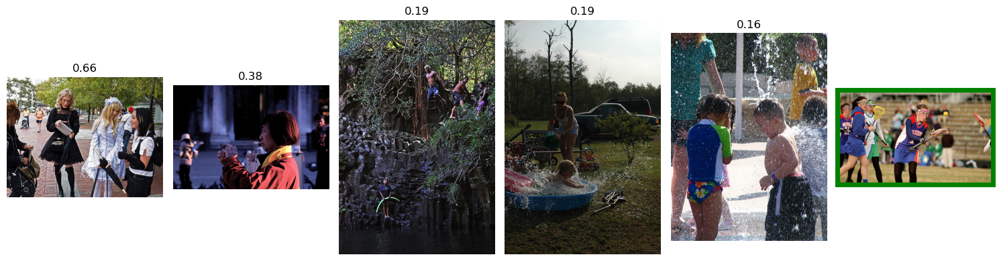

----------------------------------------------------------------------------------------------------
4/4 [==============================] - 0s 1ms/step

Six men have a band practice in the woods .




C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


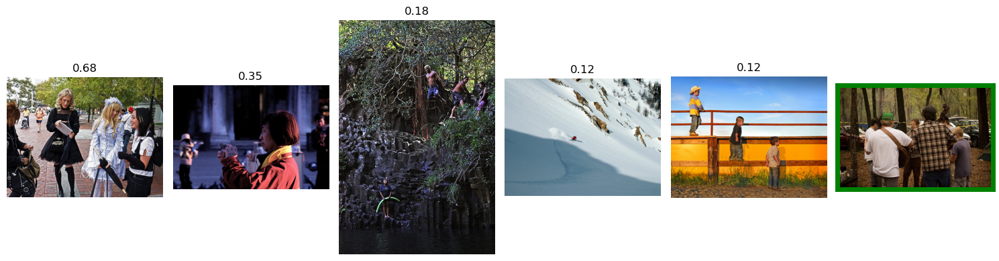

----------------------------------------------------------------------------------------------------
4/4 [==============================] - 0s 1ms/step

These girls are in uniforms and are playing field hockey .




C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


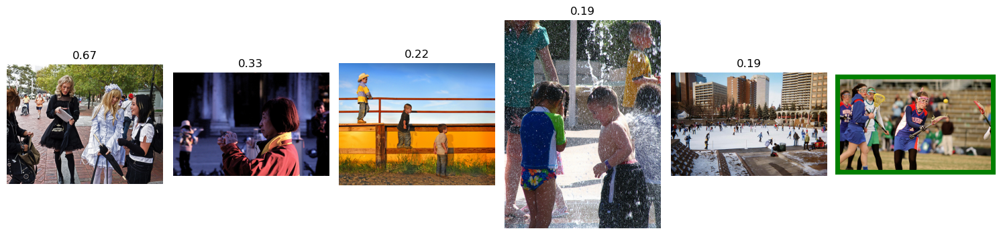

----------------------------------------------------------------------------------------------------
4/4 [==============================] - 0s 2ms/step

Two girls on a jungle gym .




C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


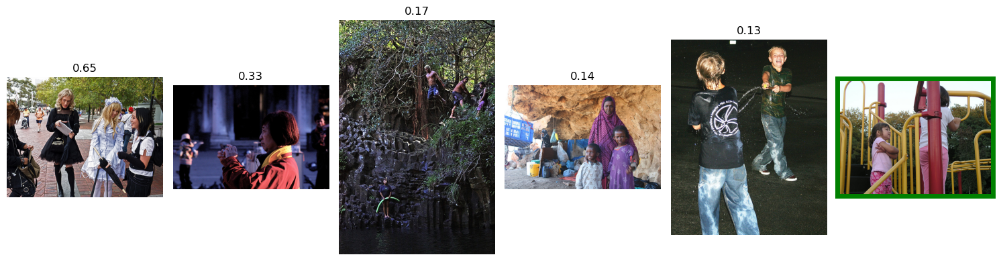

----------------------------------------------------------------------------------------------------
4/4 [==============================] - 0s 1ms/step

The lady in the multi-colored shirt has a necklace on a white object in her hand .




C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


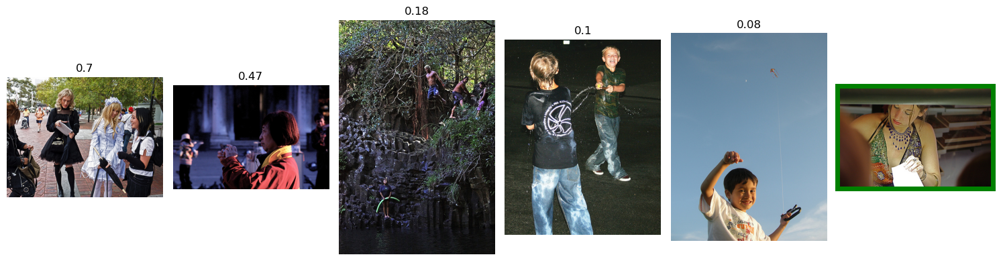

----------------------------------------------------------------------------------------------------
4/4 [==============================] - 0s 1ms/step

Man in field with a black dog jumping at his raised arm .




C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:29: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
C:\Users\Laba-ml\AppData\Local\Temp\ipykernel_7396\1101339212.py:40: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


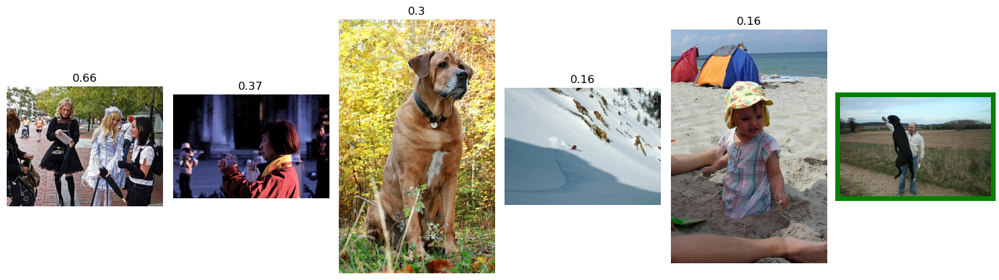

----------------------------------------------------------------------------------------------------


In [76]:
test_phrases = list(test_q['query_text'].sample(10))
for phrase in test_phrases:
    inference(phrase)

# Выводы

**Загрузка и обзор данных:**

В нашем основном датасете около 5800 строк. Пропусков в данных нет. В признаке "query_id" содержится идентификатор описания в формате <имя файла изображения>#<порядковый номер описания>. 
В CrowdAnnotations содержится 47830 строк. Пропусков также нет. Столбец pos_share содержит информацию о доле людей, которые отметили пару картинка-описание как подходящие друг другу. Но в отличие от экспертов, люди ставили только 1 или 0. Тогда как эксперты могли выставлять оценку соответствия по шкале от 1 до 4. Можно сказать, что разметка данных от экспертов более качественная. 
Выборка содержит разные по формату и тематике изображения людей и животных.

**EDA:**

Для обучения модели по поиску референсов, были восстановлены данные об оценках как для экспертов, так и для крауда, а именно были сделаны следующие шаги:

        - найдена средняя оценка экспертов;
        - для тех случаев когда менение экспертов совсем разошлось использовалась средняя оценка с округлением "вниз";
        - для всех остальных экспертных оценок использовалсь медианное значение.
        - обучена регрессионную модель для восстановления оценок экспертов на основе оценок крауда и модель для восстановления оценок крауда на основе оценок экспертов;
        - для итоговой таблицы применено простое линейное преобразование (x-1) /3, для перевода средних оценок экспертов из диапазона 1-4 в диапазон 0-1;
        - найдена средневзвешенная оценка от двух источников по соотношению 8 - эксперты : 2 - крауд;
        - восстановлено описание для одинаковых изображений из разных таблиц, а те изображения к которым нет описания удалены.

**Проверка данных на юридическое соответствие:**

Из датасета были исключены изображения с детьми (младше 16 лет)

**Векторизация изображений:**

Изображения были преобразованы в численные векторы с использованием модели `ResNet50`. Это позволило представить изображения в виде чисел и использовать их в моделях машинного обучения.

**Векторизация текстов:**

Текстовые описания были векторизованы с использованием модели `BERT`. Это позволило представить тексты в виде численных векторов, что необходимо для сравнения с векторами изображений.

**Объединение векторов:**

Векторы изображений и текстов были объединены в один признаковый массив, который используетсядля обучения модели прогноза соответствия между изображением и текстовым запросом.

**Обучение модели соответствия:**

Данные были разделены на обучающую и тестовую выборки с учетом групп изображений. Модели линейной регрессии и нейронная сеть были обучены на подготовленных данных.

- для линейной регрессии оценка RMSE составила `0.1255`
- для нейронной сети RMSE `0.1136`


Данные были успешно подготовлены и векторизованы для обучения модели, а также проведена проверка на юридическое соответствие. Модель линейной регрессии и нейронная сеть были обучены для прогнозирования соответствия между изображениями и текстовыми запросами.